In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [2]:
import tensorflow
print (tensorflow.__version__)

2.4.0


In [3]:
!wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip

--2020-12-27 08:22:37--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78456409 (75M) [application/zip]
Saving to: ‘apple2orange.zip’

apple2orange.zip    100%[===================>]  74.82M  3.48MB/s    in 25s     

2020-12-27 08:23:02 (3.03 MB/s) - ‘apple2orange.zip’ saved [78456409/78456409]



In [4]:
!unzip apple2orange.zip

Archive:  apple2orange.zip
   creating: apple2orange/
   creating: apple2orange/trainA/
  inflating: apple2orange/trainA/n07740461_6908.jpg  
  inflating: apple2orange/trainA/n07740461_7635.jpg  
  inflating: apple2orange/trainA/n07740461_586.jpg  
  inflating: apple2orange/trainA/n07740461_9813.jpg  
  inflating: apple2orange/trainA/n07740461_6835.jpg  
  inflating: apple2orange/trainA/n07740461_2818.jpg  
  inflating: apple2orange/trainA/n07740461_2918.jpg  
  inflating: apple2orange/trainA/n07740461_1213.jpg  
  inflating: apple2orange/trainA/n07740461_2476.jpg  
  inflating: apple2orange/trainA/n07740461_13596.jpg  
  inflating: apple2orange/trainA/n07740461_4093.jpg  
  inflating: apple2orange/trainA/n07740461_14738.jpg  
  inflating: apple2orange/trainA/n07740461_6477.jpg  
  inflating: apple2orange/trainA/n07740461_11356.jpg  
  inflating: apple2orange/trainA/n07740461_7594.jpg  
  inflating: apple2orange/trainA/n07740461_5119.jpg  
  inflating: apple2orange/trainA/n07740461_104

In [3]:
!ls apple2orange

testA  testB  trainA  trainB


In [4]:
import glob
apples_train = glob.glob('apple2orange/trainA/*.jpg')
oranges_train = glob.glob('apple2orange/trainB/*.jpg')
apples_test = glob.glob('apple2orange/testA/*.jpg')
oranges_test = glob.glob('apple2orange/testB/*.jpg')

In [5]:
len(apples_train), len(oranges_train), len(apples_test), len(oranges_test)

(995, 1019, 266, 248)

In [6]:
import cv2
for file in apples_train[:10]:
    img = cv2.imread(file)
    print (img.shape)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


Apples


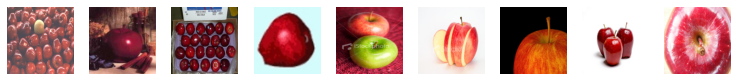

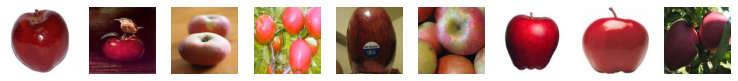

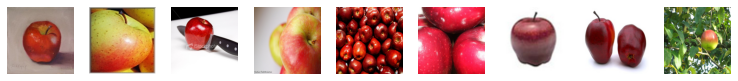

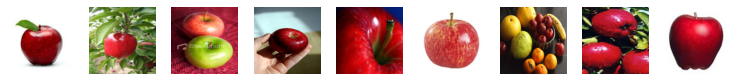

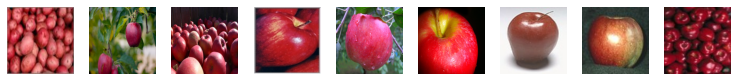

--------------------------------------------------------------------------------
Oranges


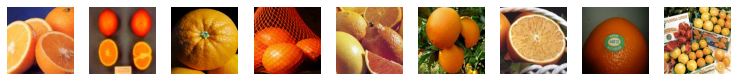

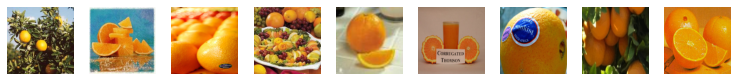

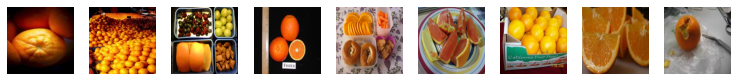

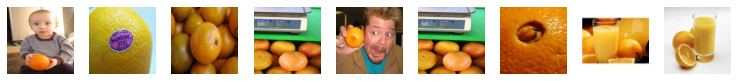

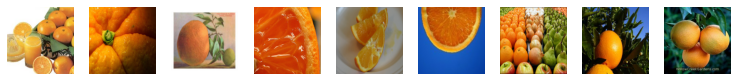

In [7]:
print ("Apples")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(apples_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

print ("-"*80)
print ("Oranges")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(oranges_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Generator Model (U-Net Like)

In [8]:
import tensorflow_addons as tfa

In [9]:
def encoder_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
        x = tfa.layers.InstanceNormalization()(x)
    return x

def decoder_layer(input_layer, skip_input, filters):
    #x = tensorflow.keras.layers.UpSampling2D(size=2)(input_layer)
    x = tensorflow.keras.layers.Conv2DTranspose(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.Activation('relu')(x)
    #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Concatenate()([x, skip_input])
    return x

In [10]:
source_image_A = tensorflow.keras.layers.Input(shape=(256, 256, 3))
source_image_B = tensorflow.keras.layers.Input(shape=(256, 256, 3))

def make_generator():
    source_image = tensorflow.keras.layers.Input(shape=(256, 256, 3))

    e1 = encoder_layer(source_image, 32, bn=False)
    e2 = encoder_layer(e1, 64)
    e3 = encoder_layer(e2, 128)
    e4 = encoder_layer(e3, 256)
    e5 = encoder_layer(e4, 256)
    e6 = encoder_layer(e5, 256)
    e7 = encoder_layer(e6, 256)

    bottle_neck = tensorflow.keras.layers.Conv2D(512, (4,4), strides=(2,2), padding='same')(e7)
    b = tensorflow.keras.layers.Activation('relu')(bottle_neck)

    d1 = decoder_layer(b, e7, 256)
    d2 = decoder_layer(d1, e6, 256)
    d3 = decoder_layer(d2, e5, 256)
    d4 = decoder_layer(d3, e4, 256)
    d5 = decoder_layer(d4, e3, 256)
    d6 = decoder_layer(d5, e2, 64)
    d7 = decoder_layer(d6, e1, 32)

    decoded = tensorflow.keras.layers.Conv2DTranspose(3, kernel_size=(4,4), strides=(2,2), padding='same')(d7)
    translated_image = tensorflow.keras.layers.Activation('tanh')(decoded)
    return source_image, translated_image

source_image, translated_image = make_generator()
generator_network_AB = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

source_image, translated_image = make_generator()
generator_network_BA = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

print (generator_network_AB.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 32) 1568        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 128, 128, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 64)   32832       leaky_re_lu[0][0]                
______________________________________________________________________________________________

# Discriminator Network

In [11]:
def my_conv_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
        x = tfa.layers.InstanceNormalization()(x)
    return x

In [12]:
 def make_discriminator():
    target_image_input = tensorflow.keras.layers.Input(shape=(256, 256, 3))

    x = my_conv_layer(target_image_input, 64, bn=False)
    x = my_conv_layer(x, 128)
    x = my_conv_layer(x, 256)
    x = my_conv_layer(x, 512)
    x = my_conv_layer(x, 512)

    patch_features = tensorflow.keras.layers.Conv2D(1, kernel_size=(4,4), strides=(1,1), padding='same')(x)
    return target_image_input, patch_features


target_image_input, patch_features = make_discriminator()
discriminator_network_A = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

target_image_input, patch_features = make_discriminator()
discriminator_network_B = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

print (discriminator_network_A.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 128, 128, 64)      3136      
_________________________________________________________________
leaky_re_lu_14 (LeakyReLU)   (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 64, 64, 128)       131200    
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (None, 64, 64, 128)       0         
_________________________________________________________________
instance_normalization_26 (I (None, 64, 64, 128)       256       
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 32, 32, 256)       5245

In [13]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network_A.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])
discriminator_network_B.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])

# Cycle-GAN

In [14]:
# Domain Transfer
fake_B = generator_network_AB(source_image_A)
fake_A = generator_network_BA(source_image_B)

# Restoring original Domain
get_back_A = generator_network_BA(fake_B)
get_back_B = generator_network_AB(fake_A)

# Get back Identical/Same Image
get_same_A = generator_network_BA(source_image_A)
get_same_B = generator_network_AB(source_image_B)
  
discriminator_network_A.trainable=False
discriminator_network_B.trainable=False

# Tell Real vs Fake, for a given domain
verify_A = discriminator_network_A(fake_A)
verify_B = discriminator_network_B(fake_B)

cycle_gan = tensorflow.keras.models.Model(inputs = [source_image_A, source_image_B], \
                              outputs = [verify_A, verify_B, get_back_A, get_back_B, get_same_A, get_same_B])
cycle_gan.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
model_1 (Functional)            (None, 256, 256, 3)  16888451    input_2[0][0]                    
                                                                 model[0][0]                      
                                                                 input_1[0][0]                    
____________________________________________________________________________________________

# Compiling Models

In [16]:
cycle_gan.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'], loss_weights=[1, 1, 10, 10, 1, 1],\
                                          optimizer=adam_optimizer)

# Define Data Generators

In [17]:
def apples_to_oranges(apples, generator_network):
    generated_samples = generator_network.predict_on_batch(apples)
    return generated_samples

def oranges_to_apples(oranges, generator_network):
    generated_samples = generator_network.predict_on_batch(oranges)
    return generated_samples

def get_apple_samples(batch_size):
    random_files = np.random.choice(apples_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    apple_images = np.array(images)
    return apple_images

def get_orange_samples(batch_size):
    random_files = np.random.choice(oranges_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    orange_images = np.array(images)
    return orange_images

def show_generator_results_apples_to_oranges(generator_network_AB, generator_network_BA):
    images = []
    for j in range(7):
        file = np.random.choice(apples_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Apple Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(770 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated (Apple -> Orange) Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = apples_to_oranges(np.array([img]), generator_network_AB)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated reverse ( Fake Oranges -> Fake Apples)')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = oranges_to_apples(np.array([img]), generator_network_BA)[0]
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

def show_generator_results_oranges_to_apples(generator_network_AB, generator_network_BA):
    images = []
    for j in range(7):
        file = np.random.choice(oranges_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Orange Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(770 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated (Apple -> Orange) Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = oranges_to_apples(np.array([img]), generator_network_BA)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated reverse (Fake Apples -> Fake Oranges)')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = apples_to_oranges(np.array([img]), generator_network_AB)[0]
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Training GAN

In [18]:
len(apples_train), len(oranges_train)

(995, 1019)

Input Apple Images


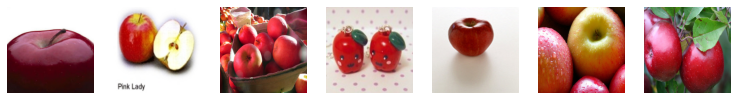

Translated (Apple -> Orange) Images


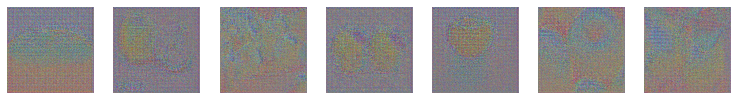

Translated reverse ( Fake Oranges -> Fake Apples)


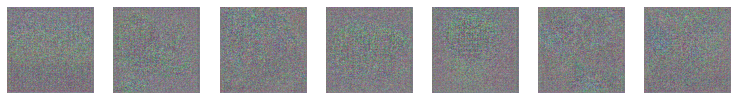

----------------------------------------------------------------------------------------------------
Input Orange Images


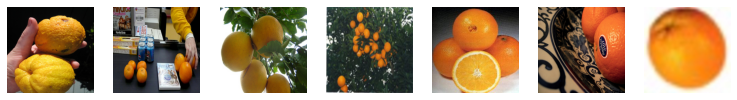

Translated (Apple -> Orange) Images


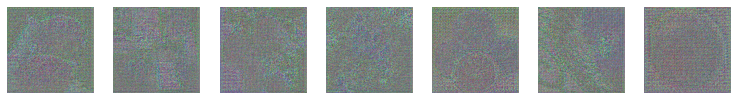

Translated reverse (Fake Apples -> Fake Oranges)


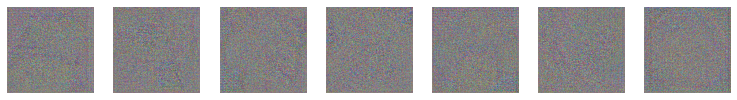

Epoch:0, Step:0, DA-Loss:2.521, DA-Acc:53.906, DB-Loss:2.534, DB-Acc:46.094, G-Loss:117.058
Epoch:0, Step:50, DA-Loss:0.360, DA-Acc:64.062, DB-Loss:0.640, DB-Acc:61.719, G-Loss:17.558
Input Apple Images


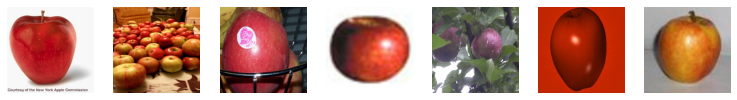

Translated (Apple -> Orange) Images


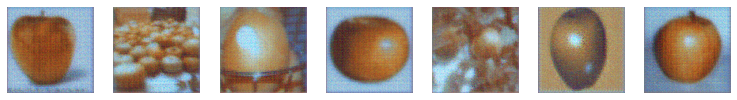

Translated reverse ( Fake Oranges -> Fake Apples)


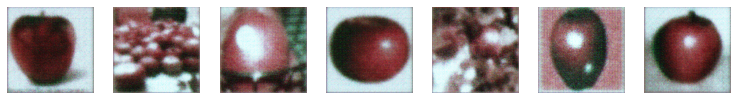

----------------------------------------------------------------------------------------------------
Input Orange Images


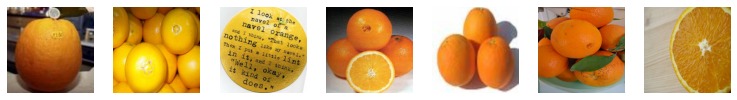

Translated (Apple -> Orange) Images


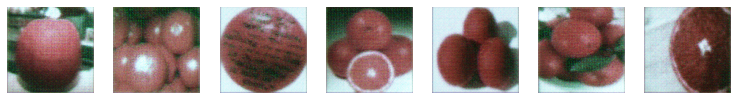

Translated reverse (Fake Apples -> Fake Oranges)


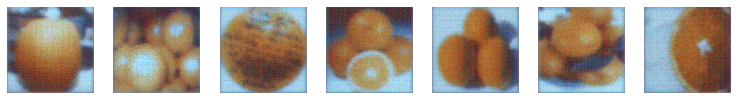

Epoch:0, Step:100, DA-Loss:0.288, DA-Acc:57.812, DB-Loss:0.415, DB-Acc:47.656, G-Loss:9.827
Epoch:0, Step:150, DA-Loss:0.213, DA-Acc:71.094, DB-Loss:0.299, DB-Acc:64.844, G-Loss:7.397
Input Apple Images


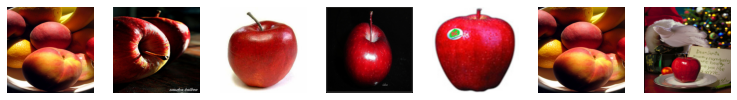

Translated (Apple -> Orange) Images


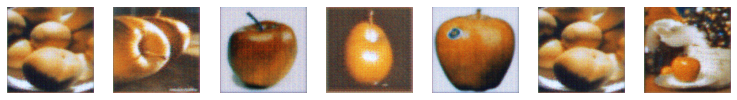

Translated reverse ( Fake Oranges -> Fake Apples)


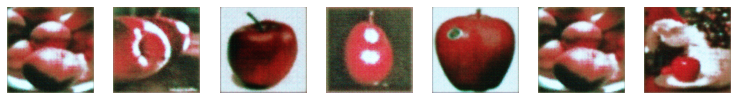

----------------------------------------------------------------------------------------------------
Input Orange Images


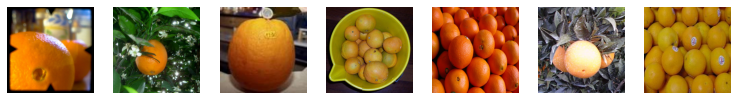

Translated (Apple -> Orange) Images


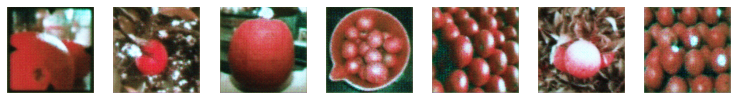

Translated reverse (Fake Apples -> Fake Oranges)


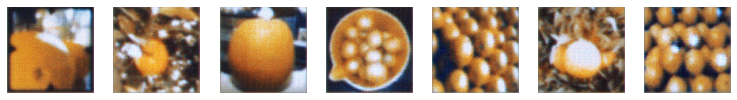

Epoch:0, Step:200, DA-Loss:0.363, DA-Acc:54.688, DB-Loss:0.315, DB-Acc:54.688, G-Loss:6.744
Epoch:0, Step:250, DA-Loss:0.423, DA-Acc:39.062, DB-Loss:0.268, DB-Acc:53.906, G-Loss:4.904
Input Apple Images


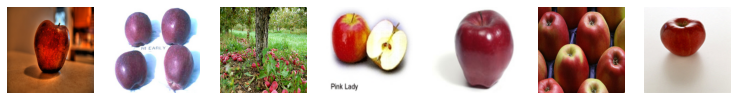

Translated (Apple -> Orange) Images


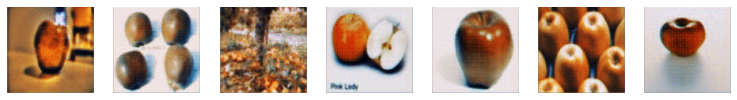

Translated reverse ( Fake Oranges -> Fake Apples)


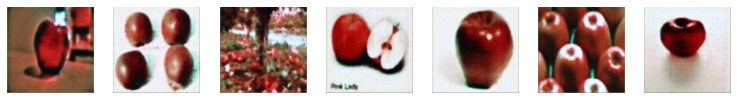

----------------------------------------------------------------------------------------------------
Input Orange Images


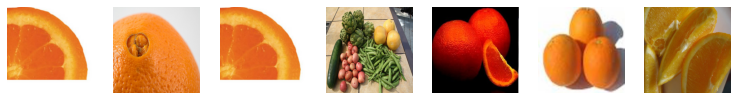

Translated (Apple -> Orange) Images


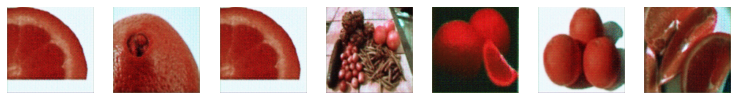

Translated reverse (Fake Apples -> Fake Oranges)


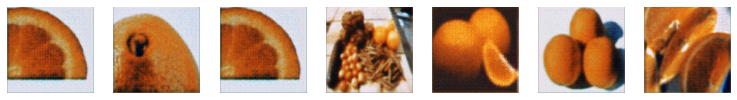

Epoch:0, Step:300, DA-Loss:0.389, DA-Acc:52.344, DB-Loss:0.352, DB-Acc:49.219, G-Loss:6.222
Epoch:0, Step:350, DA-Loss:0.353, DA-Acc:53.906, DB-Loss:0.169, DB-Acc:81.250, G-Loss:5.211
Input Apple Images


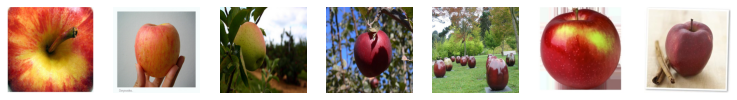

Translated (Apple -> Orange) Images


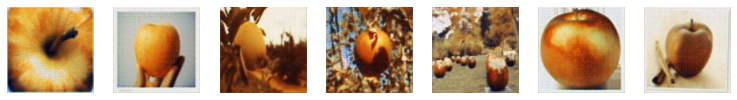

Translated reverse ( Fake Oranges -> Fake Apples)


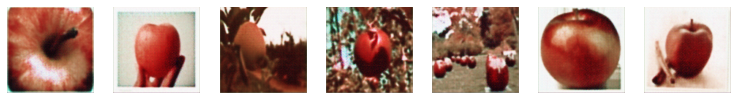

----------------------------------------------------------------------------------------------------
Input Orange Images


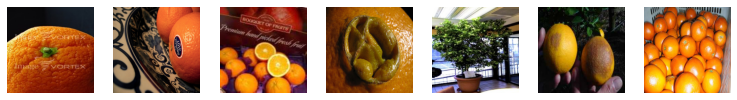

Translated (Apple -> Orange) Images


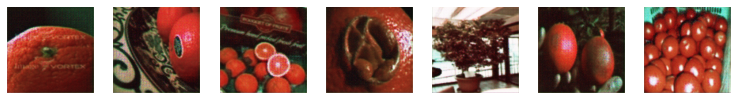

Translated reverse (Fake Apples -> Fake Oranges)


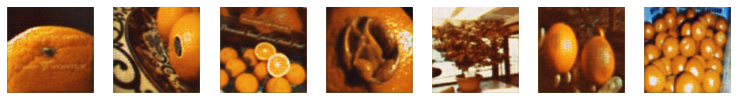

Epoch:0, Step:400, DA-Loss:0.387, DA-Acc:55.469, DB-Loss:0.235, DB-Acc:69.531, G-Loss:4.143
Epoch:0, Step:450, DA-Loss:0.312, DA-Acc:54.688, DB-Loss:0.327, DB-Acc:63.281, G-Loss:3.746
Input Apple Images


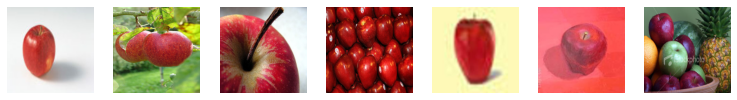

Translated (Apple -> Orange) Images


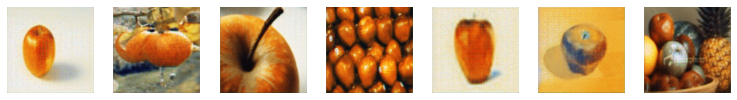

Translated reverse ( Fake Oranges -> Fake Apples)


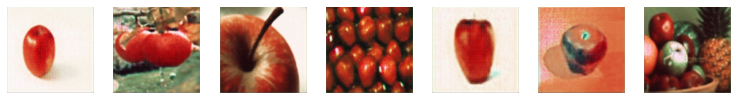

----------------------------------------------------------------------------------------------------
Input Orange Images


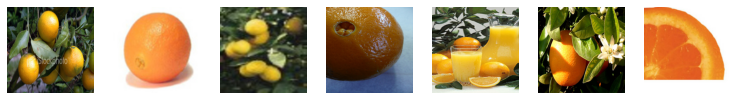

Translated (Apple -> Orange) Images


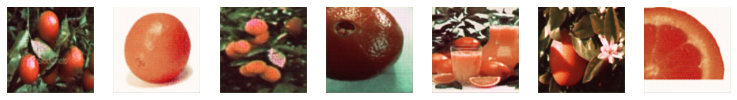

Translated reverse (Fake Apples -> Fake Oranges)


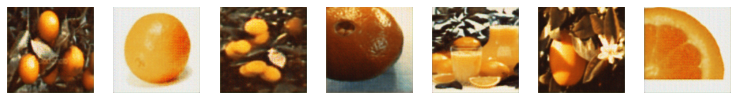

Epoch:0, Step:500, DA-Loss:0.261, DA-Acc:65.625, DB-Loss:0.298, DB-Acc:57.812, G-Loss:3.991
Epoch:0, Step:550, DA-Loss:0.302, DA-Acc:54.688, DB-Loss:0.202, DB-Acc:73.438, G-Loss:4.400
Input Apple Images


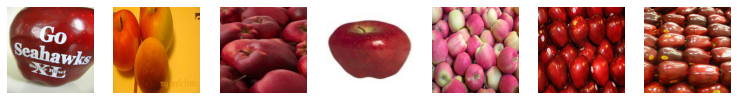

Translated (Apple -> Orange) Images


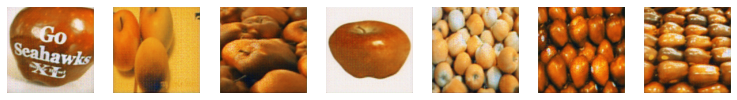

Translated reverse ( Fake Oranges -> Fake Apples)


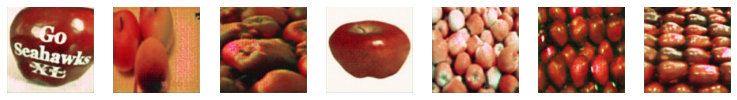

----------------------------------------------------------------------------------------------------
Input Orange Images


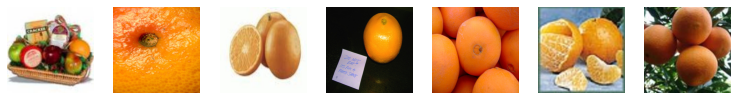

Translated (Apple -> Orange) Images


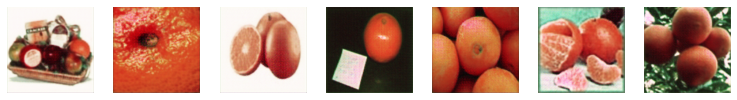

Translated reverse (Fake Apples -> Fake Oranges)


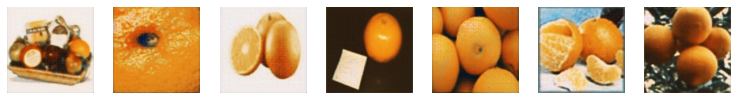

Epoch:0, Step:600, DA-Loss:0.142, DA-Acc:86.719, DB-Loss:0.154, DB-Acc:89.062, G-Loss:6.416
Epoch:0, Step:650, DA-Loss:0.127, DA-Acc:83.594, DB-Loss:0.093, DB-Acc:90.625, G-Loss:4.255
Input Apple Images


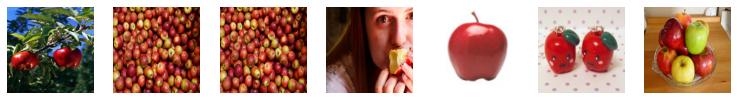

Translated (Apple -> Orange) Images


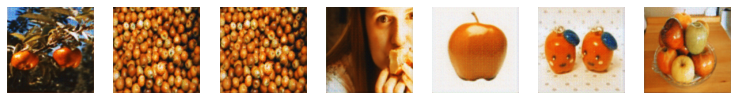

Translated reverse ( Fake Oranges -> Fake Apples)


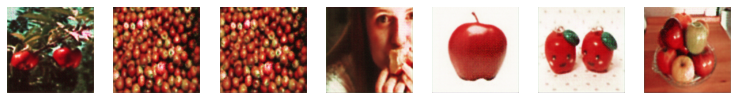

----------------------------------------------------------------------------------------------------
Input Orange Images


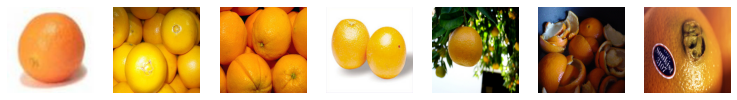

Translated (Apple -> Orange) Images


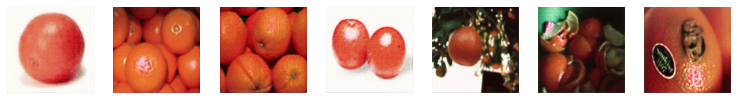

Translated reverse (Fake Apples -> Fake Oranges)


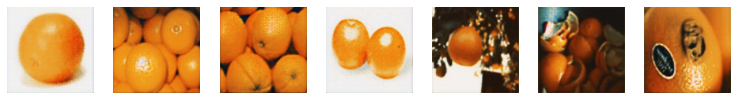

Epoch:0, Step:700, DA-Loss:0.431, DA-Acc:57.031, DB-Loss:0.264, DB-Acc:62.500, G-Loss:4.615
Epoch:0, Step:750, DA-Loss:0.141, DA-Acc:85.156, DB-Loss:0.204, DB-Acc:70.312, G-Loss:3.943
Input Apple Images


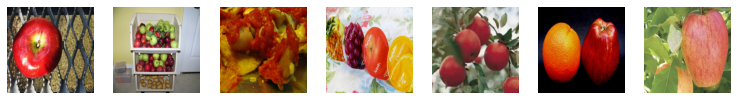

Translated (Apple -> Orange) Images


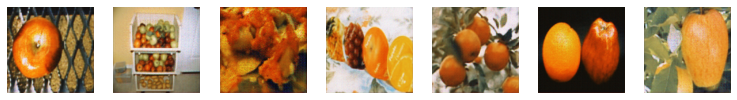

Translated reverse ( Fake Oranges -> Fake Apples)


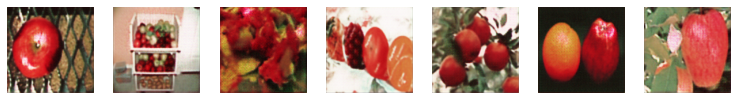

----------------------------------------------------------------------------------------------------
Input Orange Images


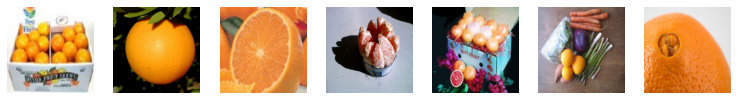

Translated (Apple -> Orange) Images


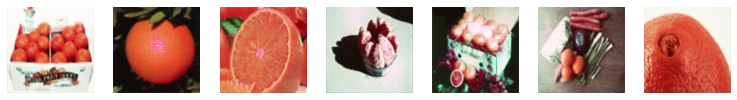

Translated reverse (Fake Apples -> Fake Oranges)


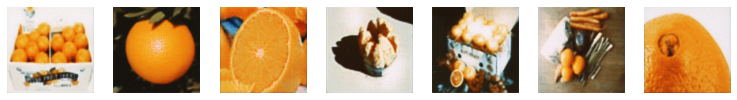

Epoch:0, Step:800, DA-Loss:0.259, DA-Acc:53.906, DB-Loss:0.210, DB-Acc:67.188, G-Loss:3.976
Epoch:0, Step:850, DA-Loss:0.652, DA-Acc:39.062, DB-Loss:0.292, DB-Acc:58.594, G-Loss:4.113
Input Apple Images


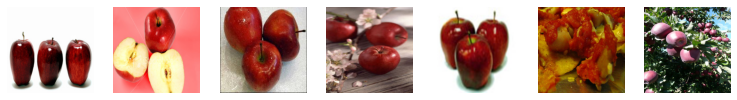

Translated (Apple -> Orange) Images


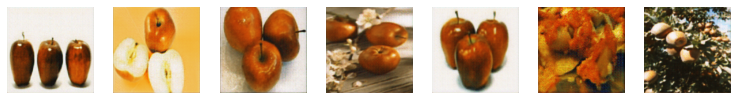

Translated reverse ( Fake Oranges -> Fake Apples)


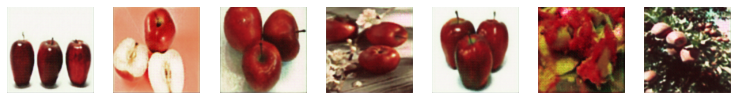

----------------------------------------------------------------------------------------------------
Input Orange Images


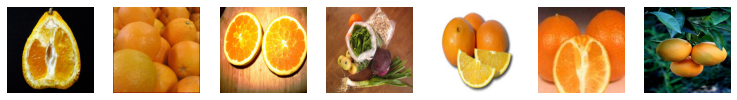

Translated (Apple -> Orange) Images


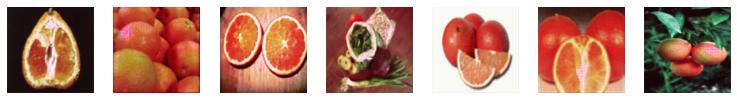

Translated reverse (Fake Apples -> Fake Oranges)


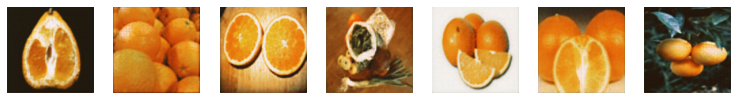

Epoch:0, Step:900, DA-Loss:0.356, DA-Acc:42.969, DB-Loss:0.391, DB-Acc:55.469, G-Loss:3.891
Epoch:0, Step:950, DA-Loss:0.295, DA-Acc:67.969, DB-Loss:0.198, DB-Acc:73.438, G-Loss:5.060
Input Apple Images


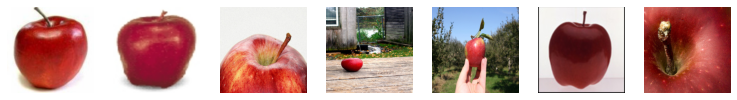

Translated (Apple -> Orange) Images


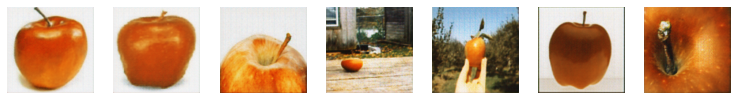

Translated reverse ( Fake Oranges -> Fake Apples)


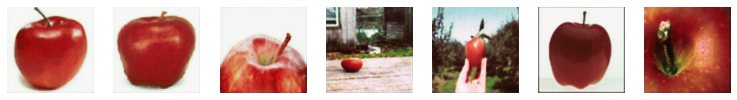

----------------------------------------------------------------------------------------------------
Input Orange Images


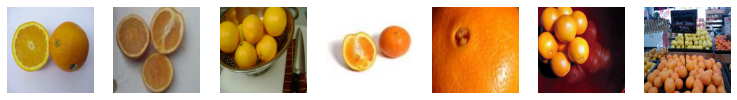

Translated (Apple -> Orange) Images


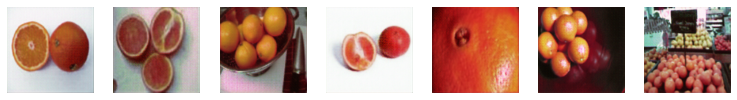

Translated reverse (Fake Apples -> Fake Oranges)


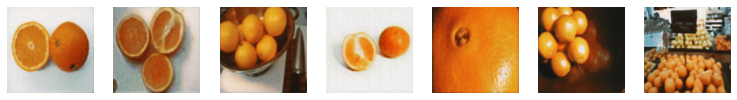

Epoch:1, Step:0, DA-Loss:0.239, DA-Acc:80.469, DB-Loss:0.114, DB-Acc:86.719, G-Loss:5.307
Epoch:1, Step:50, DA-Loss:0.349, DA-Acc:47.656, DB-Loss:0.336, DB-Acc:50.781, G-Loss:3.925
Input Apple Images


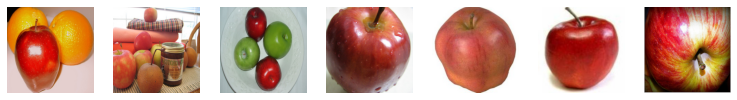

Translated (Apple -> Orange) Images


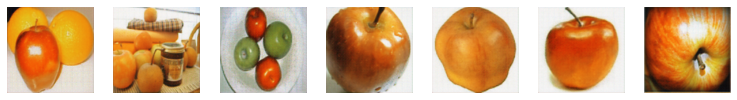

Translated reverse ( Fake Oranges -> Fake Apples)


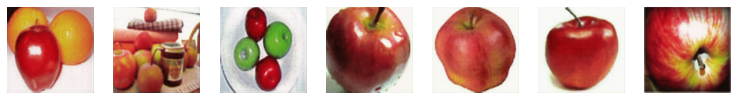

----------------------------------------------------------------------------------------------------
Input Orange Images


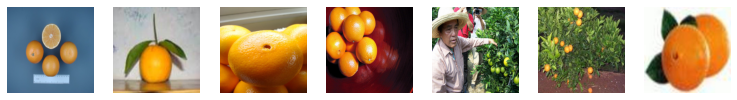

Translated (Apple -> Orange) Images


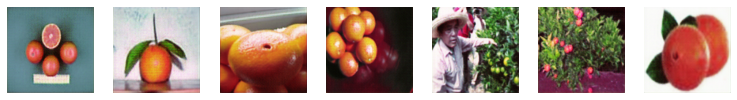

Translated reverse (Fake Apples -> Fake Oranges)


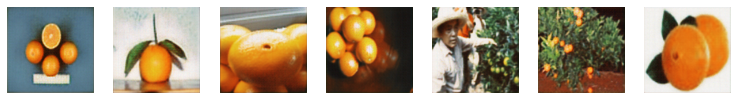

Epoch:1, Step:100, DA-Loss:0.248, DA-Acc:64.062, DB-Loss:0.312, DB-Acc:56.250, G-Loss:3.978
Epoch:1, Step:150, DA-Loss:0.332, DA-Acc:60.156, DB-Loss:0.270, DB-Acc:58.594, G-Loss:3.510
Input Apple Images


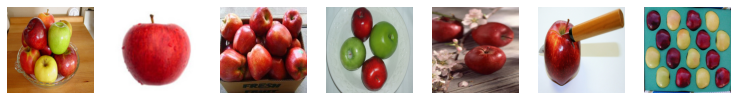

Translated (Apple -> Orange) Images


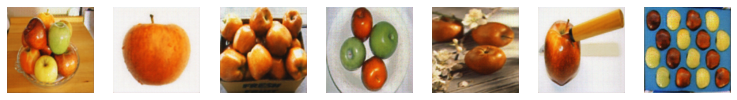

Translated reverse ( Fake Oranges -> Fake Apples)


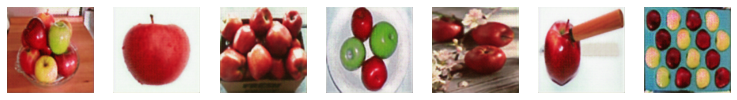

----------------------------------------------------------------------------------------------------
Input Orange Images


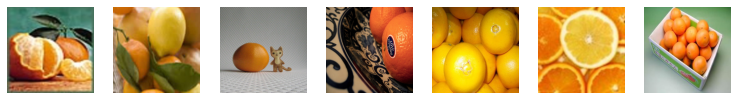

Translated (Apple -> Orange) Images


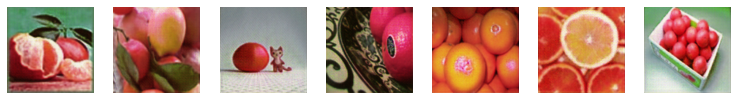

Translated reverse (Fake Apples -> Fake Oranges)


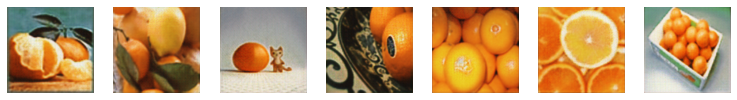

Epoch:1, Step:200, DA-Loss:0.297, DA-Acc:53.125, DB-Loss:0.246, DB-Acc:60.938, G-Loss:3.083
Epoch:1, Step:250, DA-Loss:0.293, DA-Acc:53.125, DB-Loss:0.349, DB-Acc:48.438, G-Loss:4.493
Input Apple Images


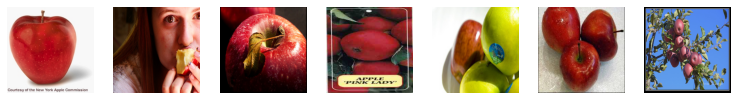

Translated (Apple -> Orange) Images


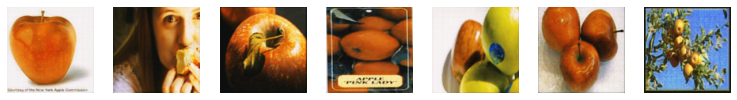

Translated reverse ( Fake Oranges -> Fake Apples)


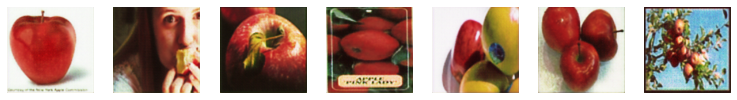

----------------------------------------------------------------------------------------------------
Input Orange Images


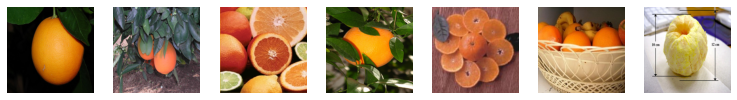

Translated (Apple -> Orange) Images


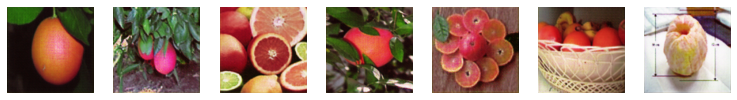

Translated reverse (Fake Apples -> Fake Oranges)


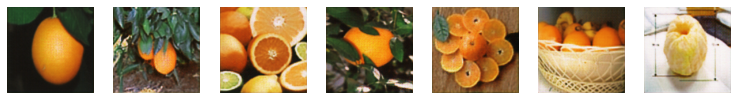

Epoch:1, Step:300, DA-Loss:0.510, DA-Acc:42.969, DB-Loss:0.222, DB-Acc:67.188, G-Loss:3.246
Epoch:1, Step:350, DA-Loss:0.206, DA-Acc:66.406, DB-Loss:0.138, DB-Acc:79.688, G-Loss:3.569
Input Apple Images


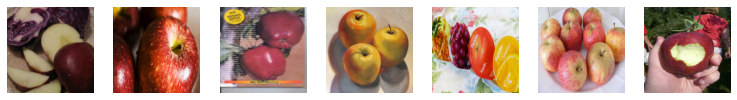

Translated (Apple -> Orange) Images


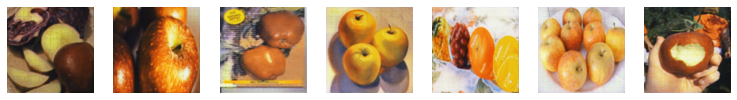

Translated reverse ( Fake Oranges -> Fake Apples)


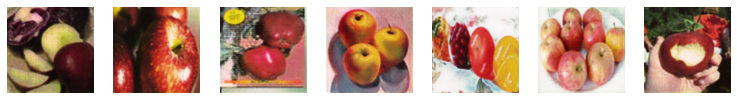

----------------------------------------------------------------------------------------------------
Input Orange Images


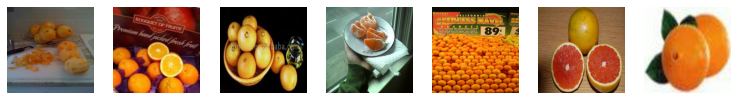

Translated (Apple -> Orange) Images


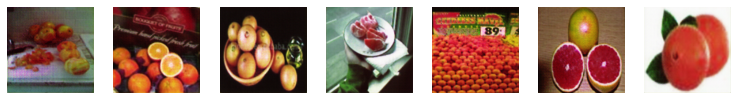

Translated reverse (Fake Apples -> Fake Oranges)


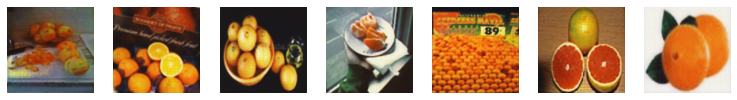

Epoch:1, Step:400, DA-Loss:0.250, DA-Acc:60.156, DB-Loss:0.324, DB-Acc:44.531, G-Loss:3.360
Epoch:1, Step:450, DA-Loss:0.402, DA-Acc:32.812, DB-Loss:0.249, DB-Acc:70.312, G-Loss:4.130
Input Apple Images


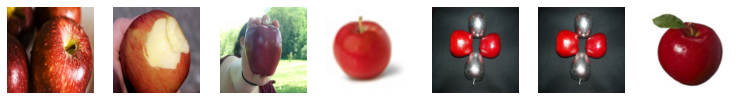

Translated (Apple -> Orange) Images


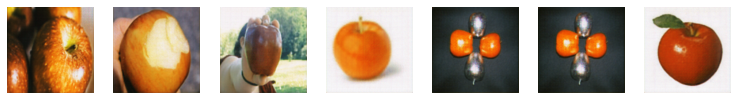

Translated reverse ( Fake Oranges -> Fake Apples)


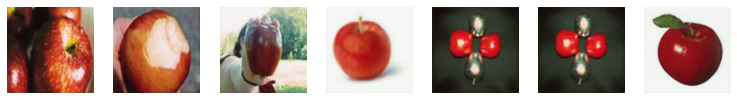

----------------------------------------------------------------------------------------------------
Input Orange Images


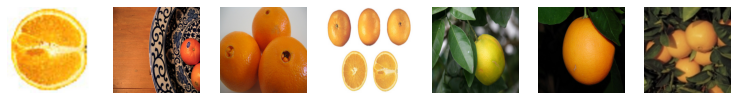

Translated (Apple -> Orange) Images


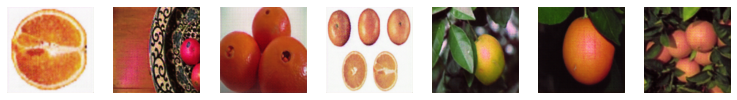

Translated reverse (Fake Apples -> Fake Oranges)


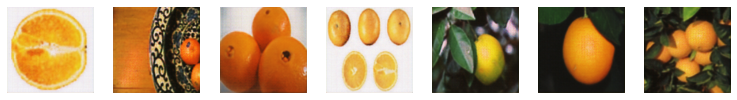

Epoch:1, Step:500, DA-Loss:0.284, DA-Acc:59.375, DB-Loss:0.267, DB-Acc:68.750, G-Loss:3.088
Epoch:1, Step:550, DA-Loss:0.333, DA-Acc:45.312, DB-Loss:0.314, DB-Acc:51.562, G-Loss:3.050
Input Apple Images


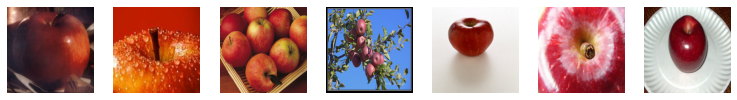

Translated (Apple -> Orange) Images


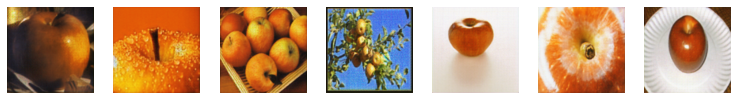

Translated reverse ( Fake Oranges -> Fake Apples)


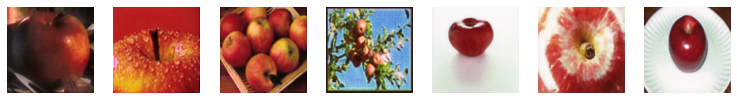

----------------------------------------------------------------------------------------------------
Input Orange Images


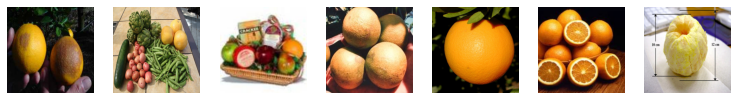

Translated (Apple -> Orange) Images


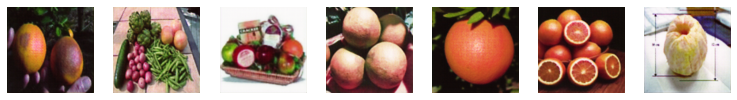

Translated reverse (Fake Apples -> Fake Oranges)


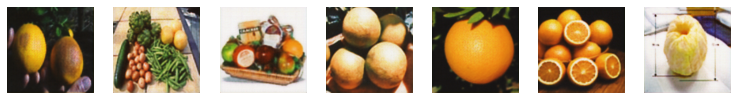

Epoch:1, Step:600, DA-Loss:0.350, DA-Acc:34.375, DB-Loss:0.334, DB-Acc:37.500, G-Loss:3.240


KeyboardInterrupt: ignored

In [19]:
epochs = 500
batch_size = 1
steps = 1000

for i in range(0, epochs):
    for j in range(steps):  
        if j%100 == 0:
            show_generator_results_apples_to_oranges(generator_network_AB, generator_network_BA)
            print ("-"*100)
            show_generator_results_oranges_to_apples(generator_network_AB, generator_network_BA)

        # A == Apples
        # B == Oranges
        domain_A_images = get_apple_samples(batch_size)
        domain_B_images = get_orange_samples(batch_size)

        fake_patch = np.zeros((batch_size, 8, 8, 1))
        real_patch = np.ones((batch_size, 8, 8, 1))
        
        fake_B_images = generator_network_AB(domain_A_images)
        fake_A_images = generator_network_BA(domain_B_images)
        
        # Updating Discriminator A weights
        discriminator_network_A.trainable=True
        discriminator_network_B.trainable=False
        loss_d_real_A = discriminator_network_A.train_on_batch(domain_A_images, real_patch)
        loss_d_fake_A = discriminator_network_A.train_on_batch(fake_A_images, fake_patch)
        
        loss_d_A = np.add(loss_d_real_A, loss_d_fake_A)/2.0
        
        # Updating Discriminator B weights
        discriminator_network_B.trainable=True
        discriminator_network_A.trainable=False
        loss_d_real_B = discriminator_network_B.train_on_batch(domain_B_images, real_patch)
        loss_d_fake_B = discriminator_network_B.train_on_batch(fake_B_images, fake_patch)
        
        loss_d_B = np.add(loss_d_real_B, loss_d_fake_B)/2.0
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        
        discriminator_network_A.trainable=False
        discriminator_network_B.trainable=False
        
        # Updating Generator weights
        loss_g = cycle_gan.train_on_batch([domain_A_images, domain_B_images],\
                    [real_patch, real_patch, domain_A_images, domain_B_images, domain_A_images, domain_B_images])
        
        if j%50 == 0:
            print ("Epoch:%.0f, Step:%.0f, DA-Loss:%.3f, DA-Acc:%.3f, DB-Loss:%.3f, DB-Acc:%.3f, G-Loss:%.3f"\
                   %(i,j,loss_d_A[0],loss_d_A[1]*100,loss_d_B[0],loss_d_B[1]*100,loss_g[0]))
            